In [17]:
import numpy as np
import graphviz
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import os

In [18]:
from google.colab import files
data_to_load = files.upload()

Saving winequality-red.csv to winequality-red (1).csv


In [20]:
import io
df = pd.read_csv(io.BytesIO(data_to_load['winequality-red.csv']))

In [ ]:

df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# Model

In [21]:
from sklearn.model_selection import train_test_split

# The target variable is 'quality'.
target = 'quality'
Y = df[target]
X = df.drop(target, axis = 1)

# Split the data into train and test data:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

In [22]:
# Build the model with the random forest regression algorithm:
model = RandomForestClassifier(max_depth=6, random_state=0, n_estimators=1000)
model.fit(X_train, Y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=6, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [ ]:
if isinstance(X_test, np.ndarray):
  X_test = pd.DataFrame(X_test, columns=["col{}".format(k) for k in range(X_test.shape[1])])
if isinstance(X_train, np.ndarray):
  X_train = pd.DataFrame(X_train, columns=["col{}".format(k) for k in range(X_train.shape[1])])
if isinstance(Y_test, np.ndarray):
  Y_test = pd.DataFrame(Y_test, columns=["col{}".format(k) for k in range(Y_test.shape[1])])
if isinstance(Y_train, np.ndarray):
  Y_train = pd.DataFrame(Y_train, columns=["col{}".format(k) for k in range(Y_train.shape[1])])

In [ ]:
from sklearn.tree import export_graphviz
from sklearn import tree

https://stackoverflow.com/questions/40155128/plot-trees-for-a-random-forest-in-python-with-scikit-learn

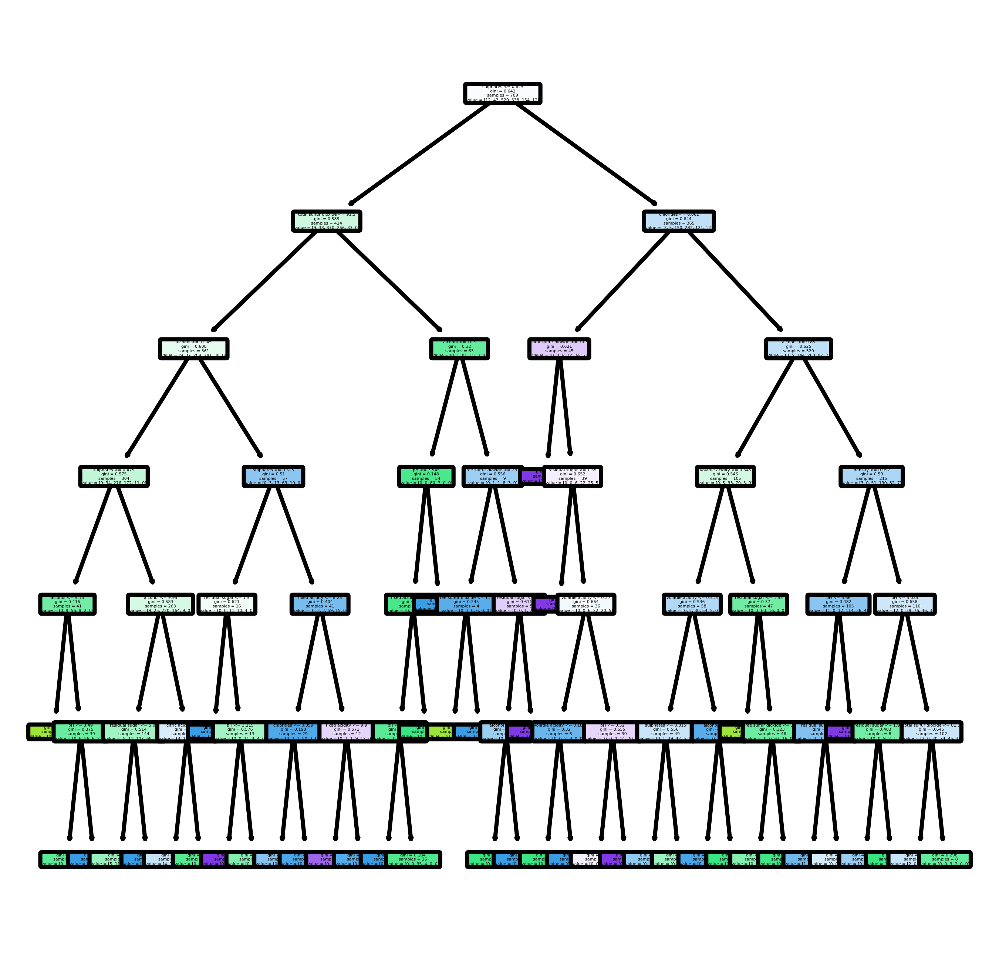

In [ ]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)

_=tree.plot_tree(model.estimators_[0],
                feature_names=X.columns,
                filled=True,
                rounded=True)

# PDP

https://www.kaggle.com/dansbecker/partial-plots

In [ ]:
!pip install pdpbox

     |████████████████████████████████| 57.7MB 74kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.0-cp36-none-any.whl size=57690722 sha256=8381b31bbf6e195895fbccd5a97fe03c6ca94102ebf468bb880b5cd8f724af69
  Stored in directory: /root/.cache/pip/wheels/7d/08/51/63fd122b04a2c87d780464eeffb94867c75bd96a64d500a3fe
Successfully built pdpbox


In [ ]:
from pdpbox import pdp, get_dataset, info_plots

In [ ]:
def plot_pdp(model, df, feature, cluster_flag=False, nb_clusters=None, lines_flag=False):
    
    # Create the data that we will plot
    pdp_goals = pdp.pdp_isolate(model=model, dataset=df, model_features=df.columns.tolist(), feature=feature)

    # plot it
    pdp.pdp_plot(pdp_goals, feature, cluster=cluster_flag, n_cluster_centers=nb_clusters, plot_lines=lines_flag)
    plt.show()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


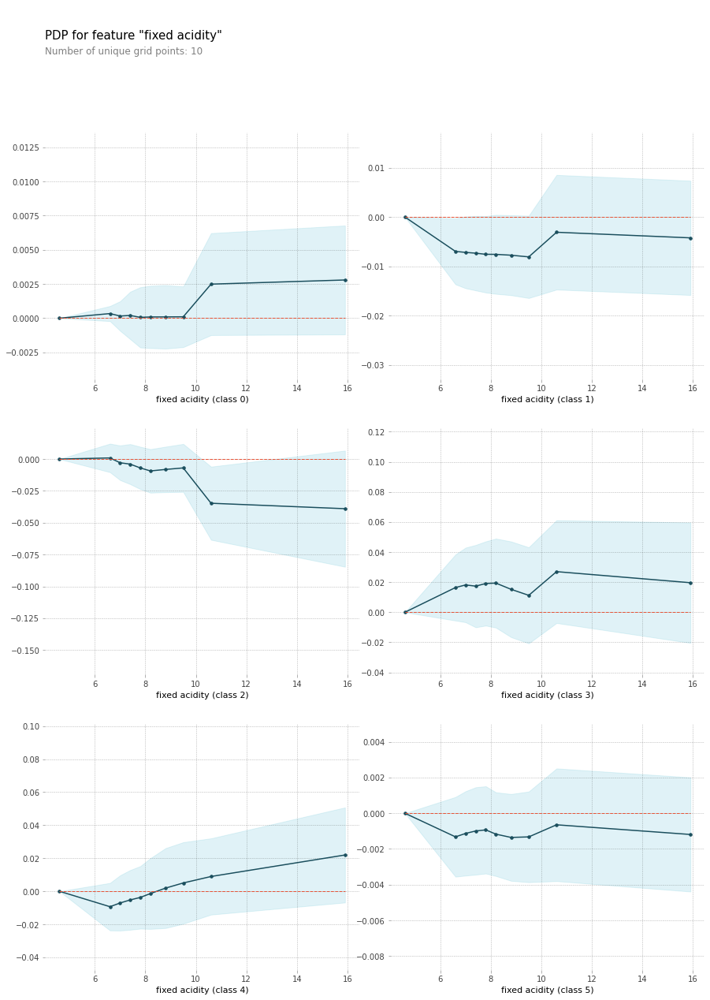

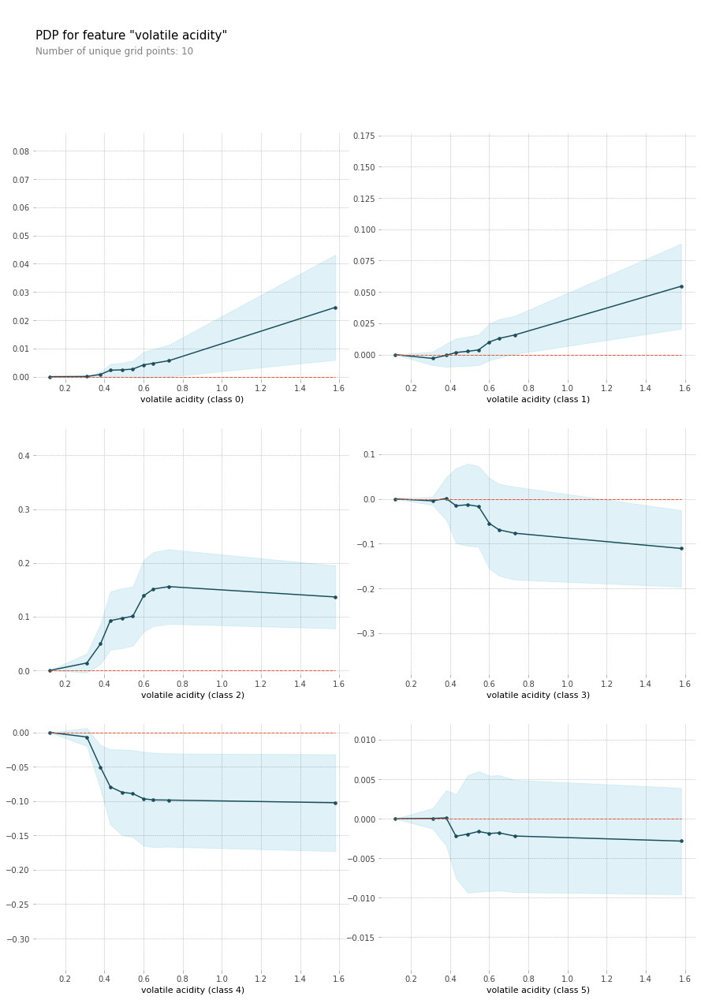

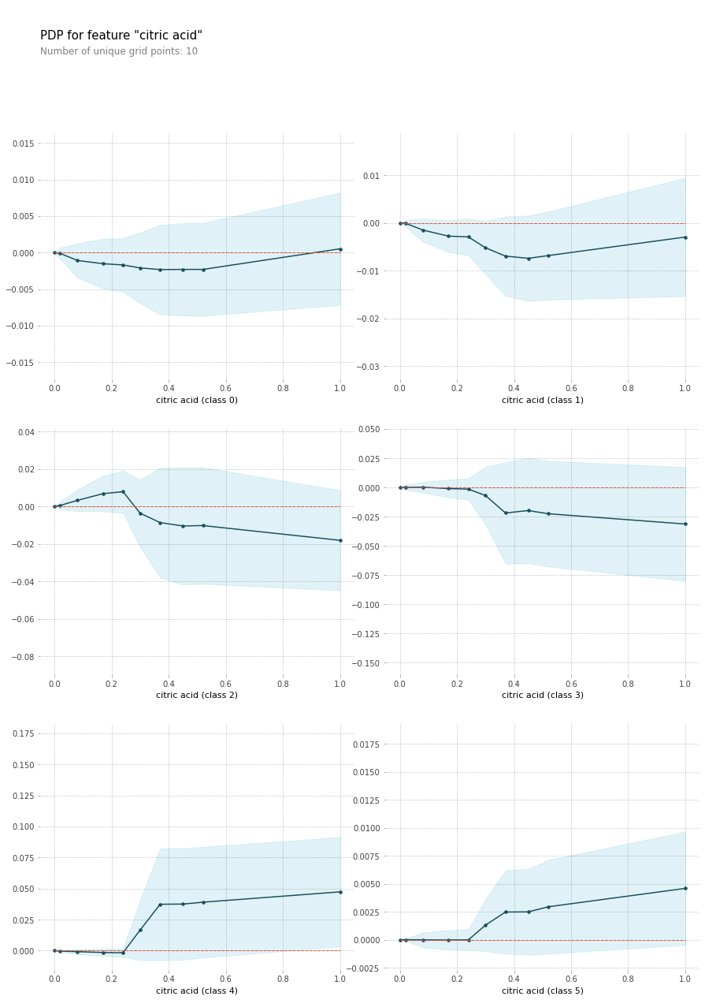

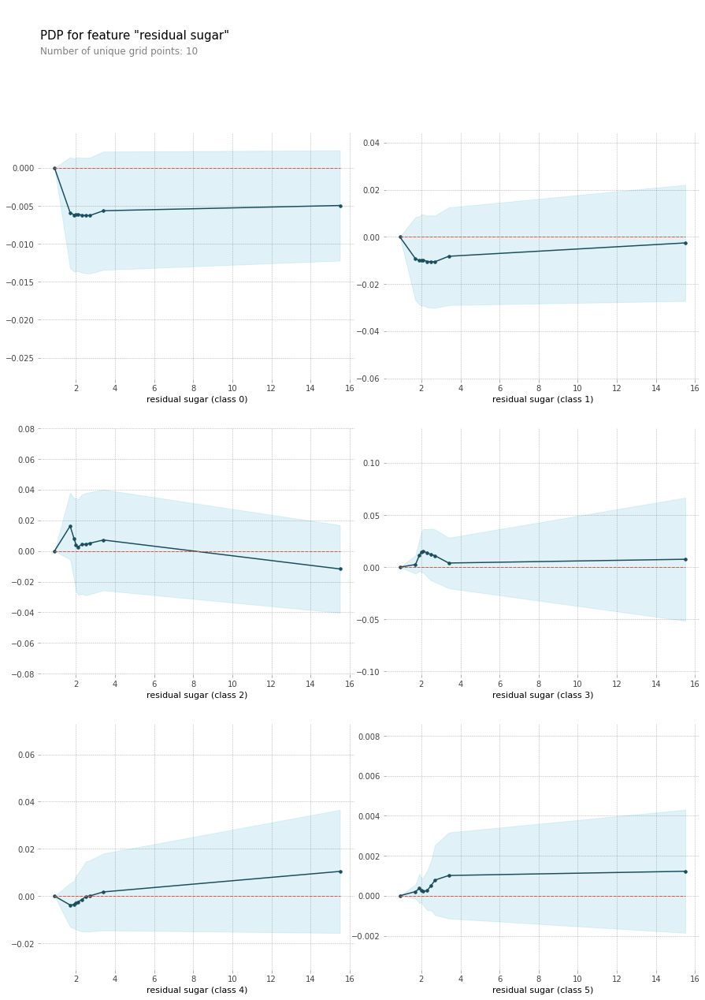

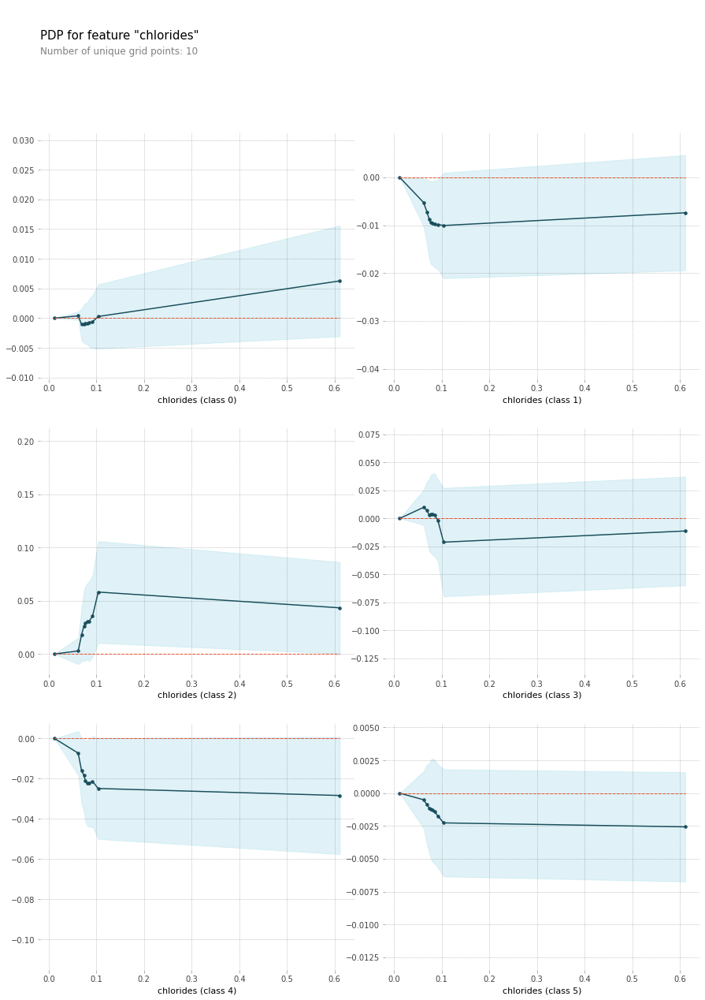

...

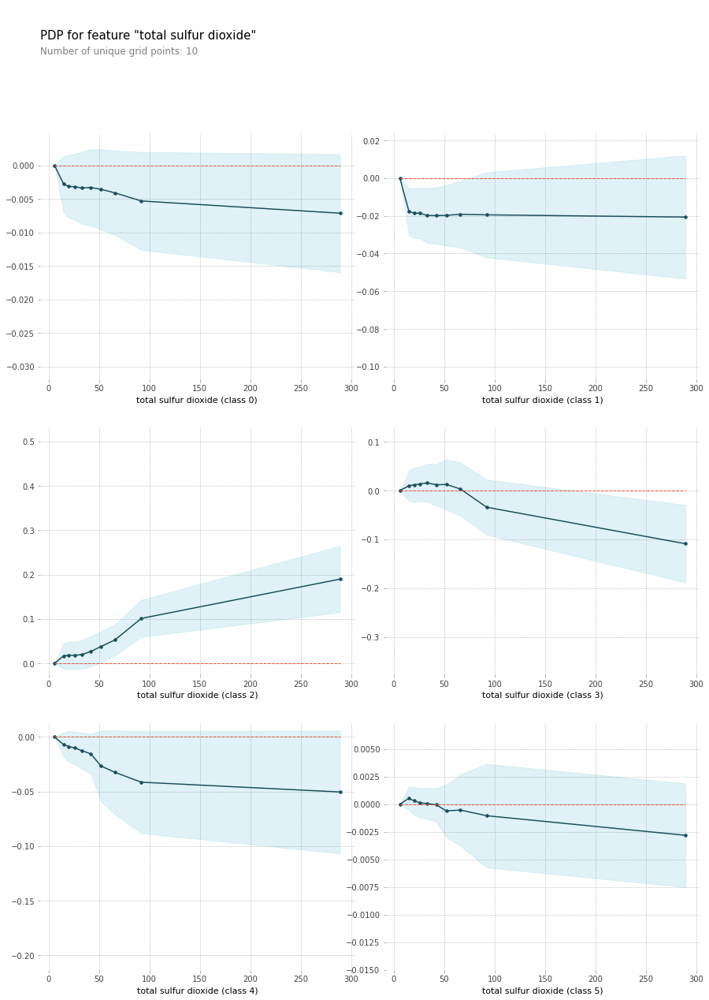

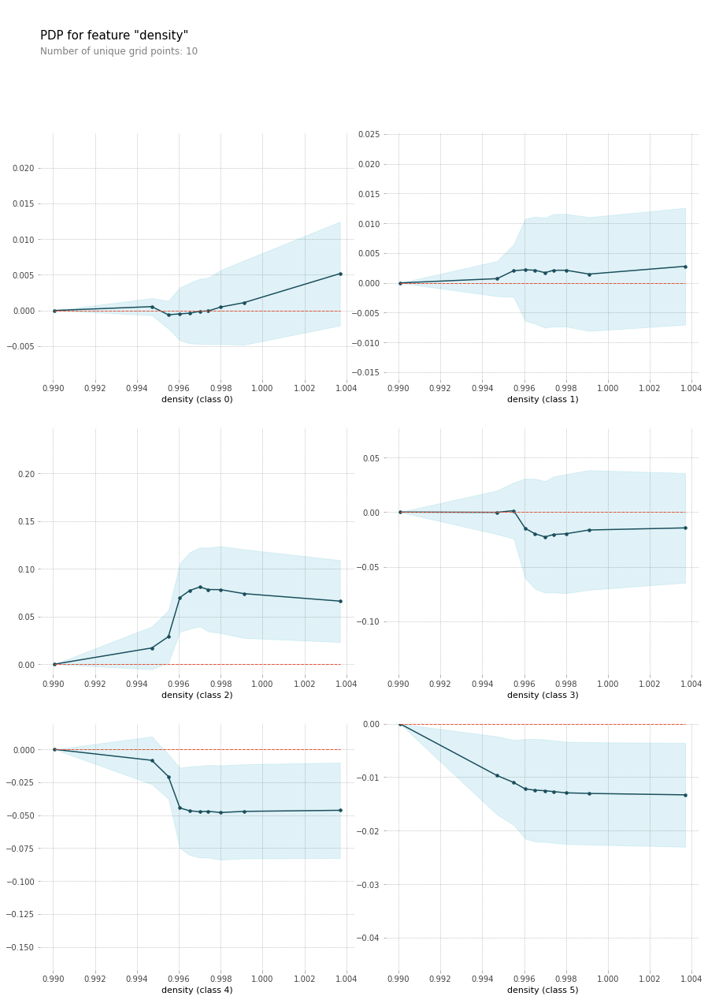

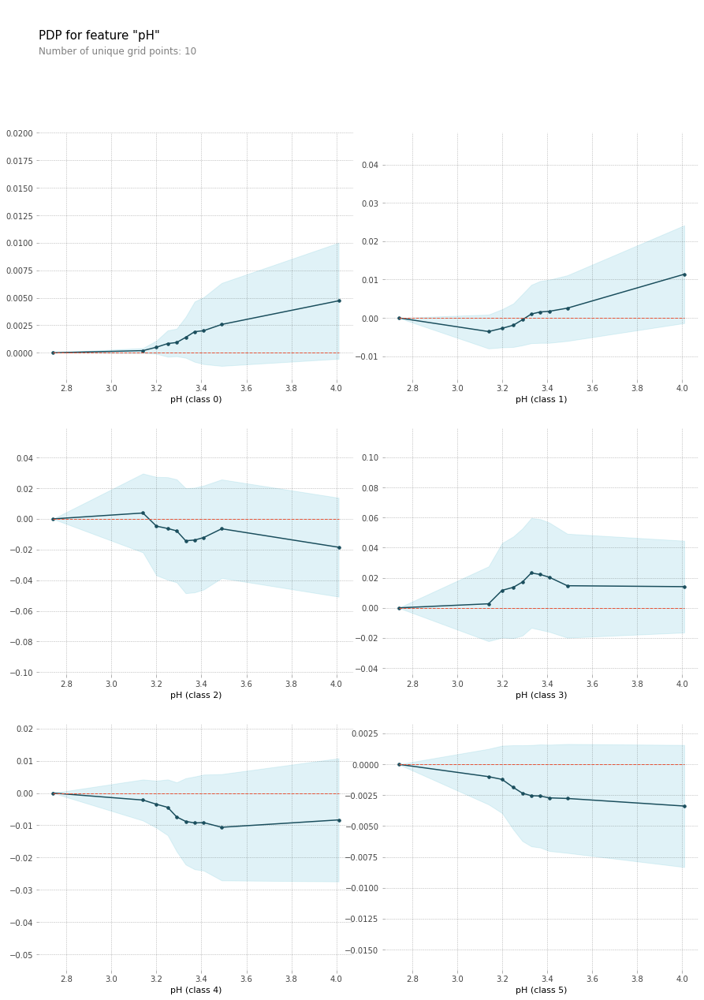

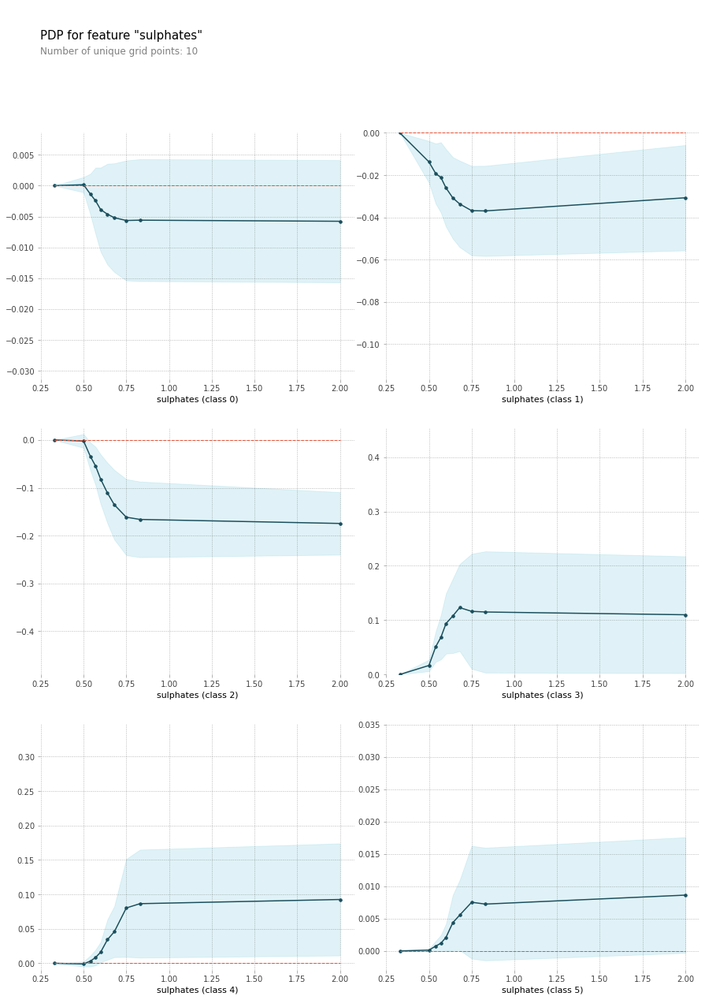

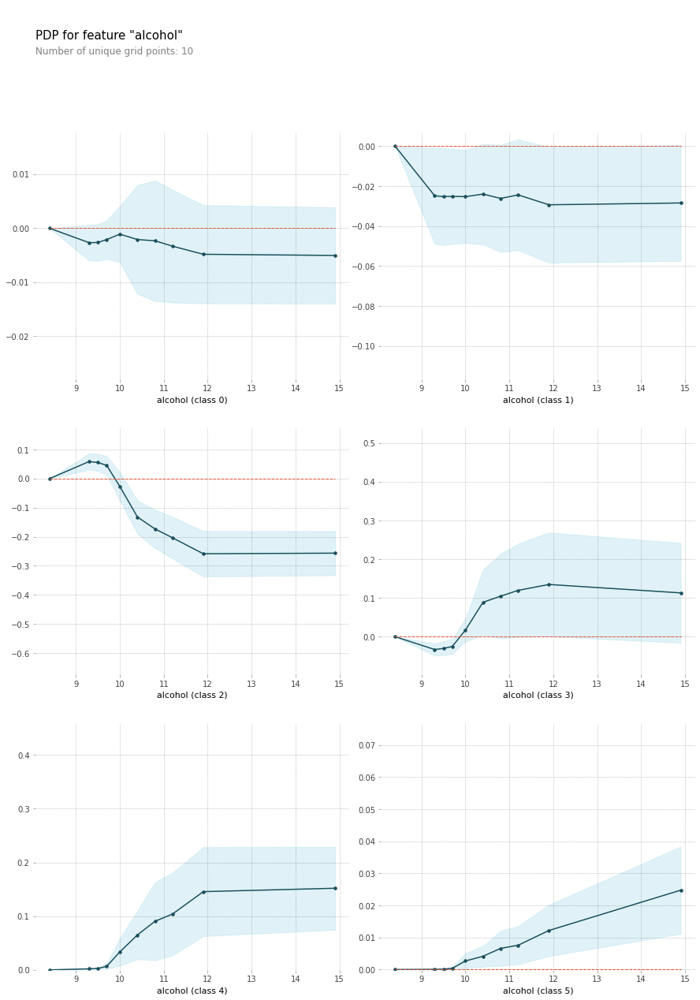

In [ ]:
for column in X_train.columns :

  plot_pdp(model, X_train, column)

# ICE

http://savvastjortjoglou.com/intrepretable-machine-learning-nfl-combine.html

https://stackoverflow.com/questions/60164019/pycebox-iceplot-does-not-work-on-xgboost-while-work-on-random-forest

In [ ]:
!pip install pycebox

  Created wheel for pycebox: filename=pycebox-0.0.1-cp36-none-any.whl size=3644 sha256=c0b62ea5c2d55a5df1561138df93fd59626c24be2927c4d8ab969d6f9834673c
  Stored in directory: /root/.cache/pip/wheels/58/5e/65/001126ca8b1f5c71e9571d09ba579e82bb0792062e7a82e77c
Successfully built pycebox


In [ ]:
from pycebox.ice import ice, ice_plot

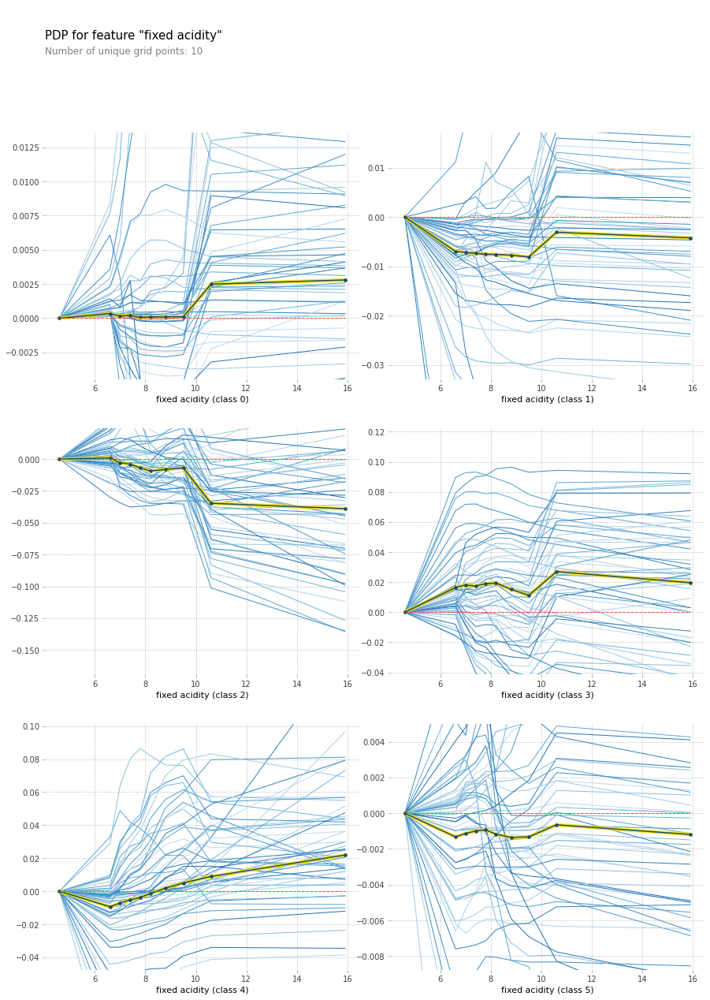

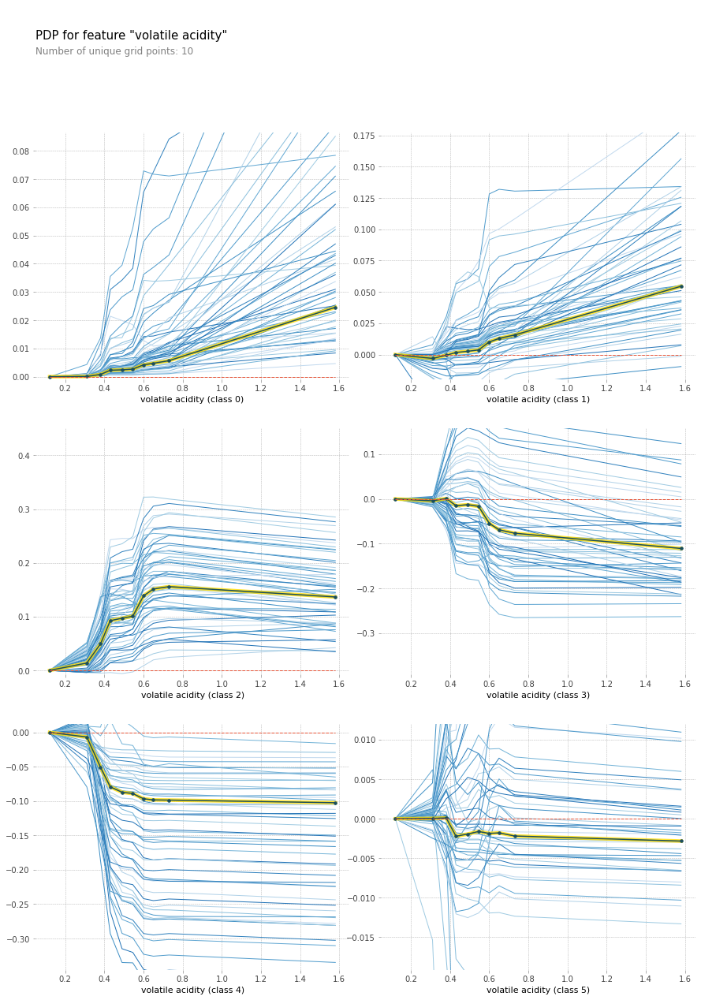

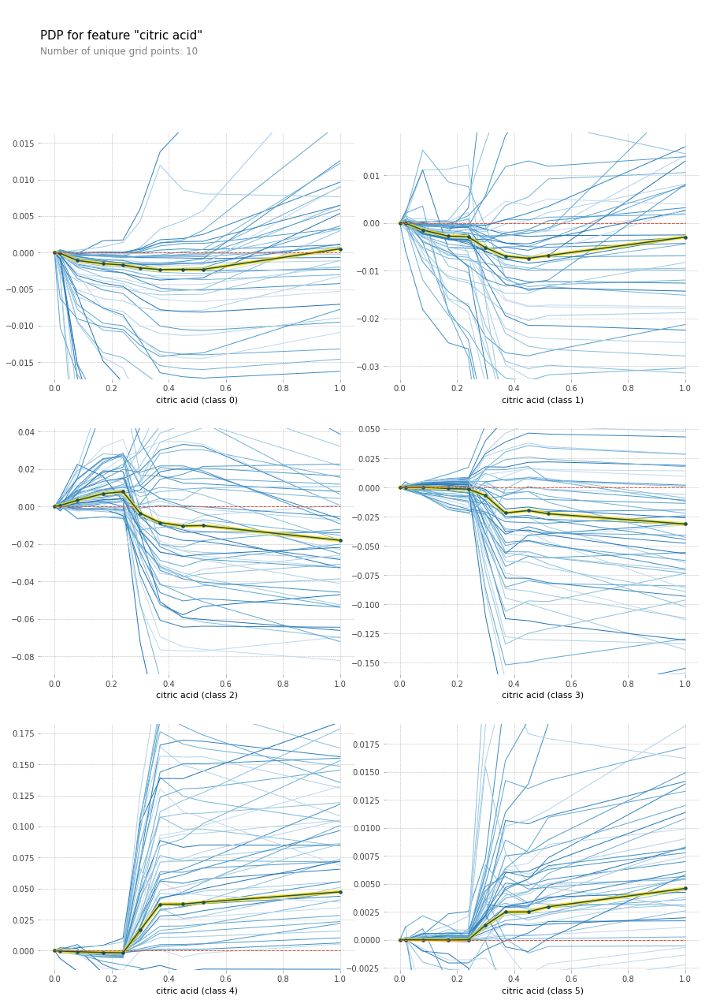

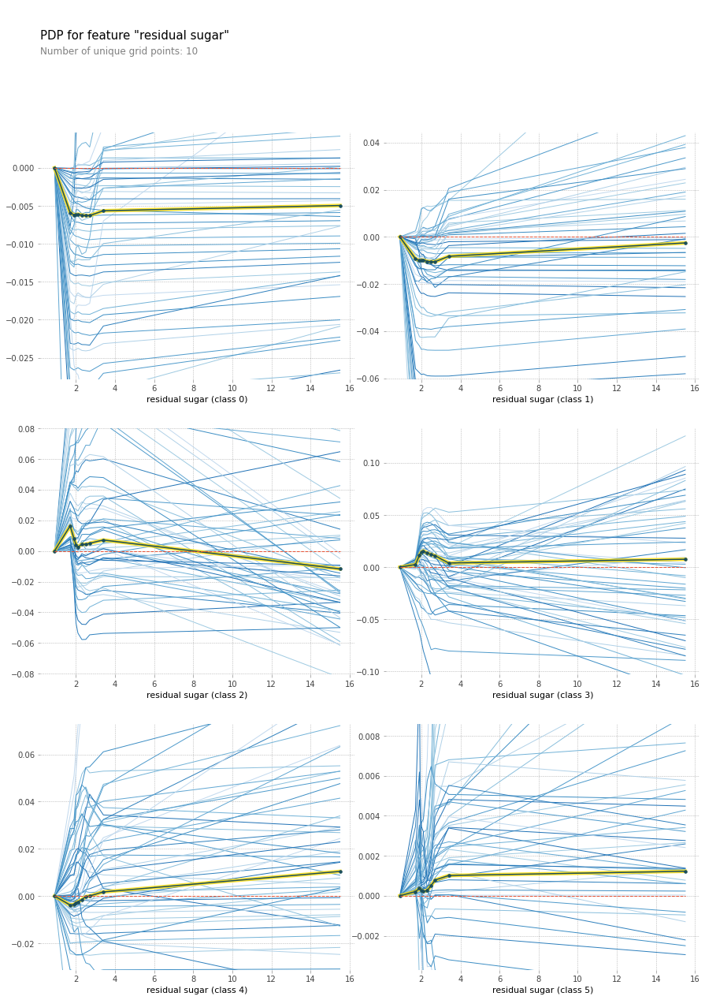

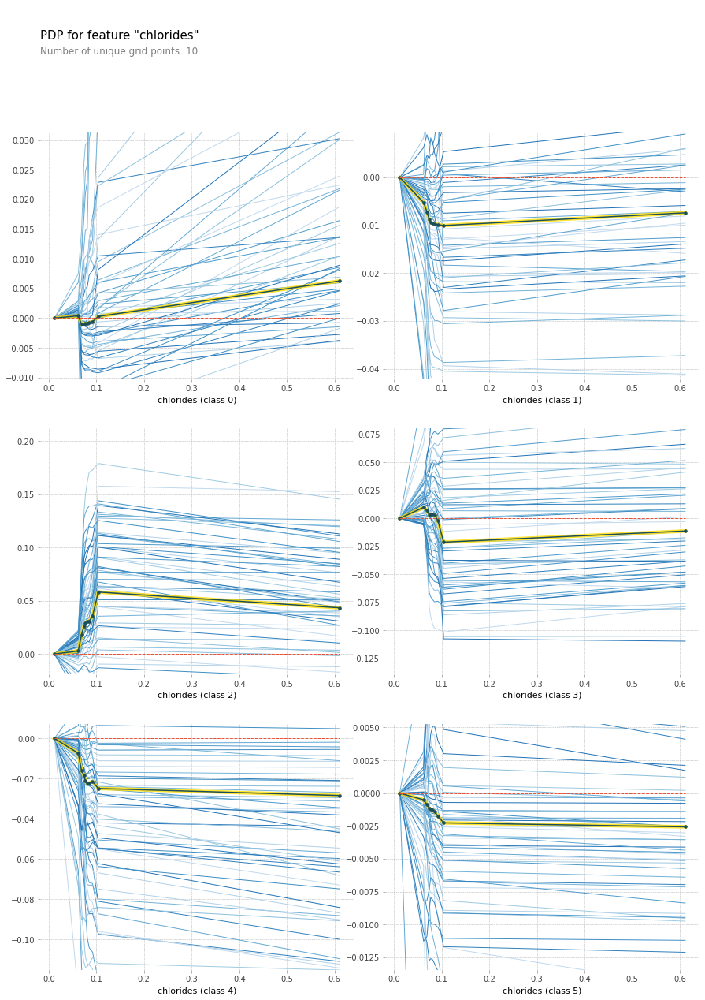

...

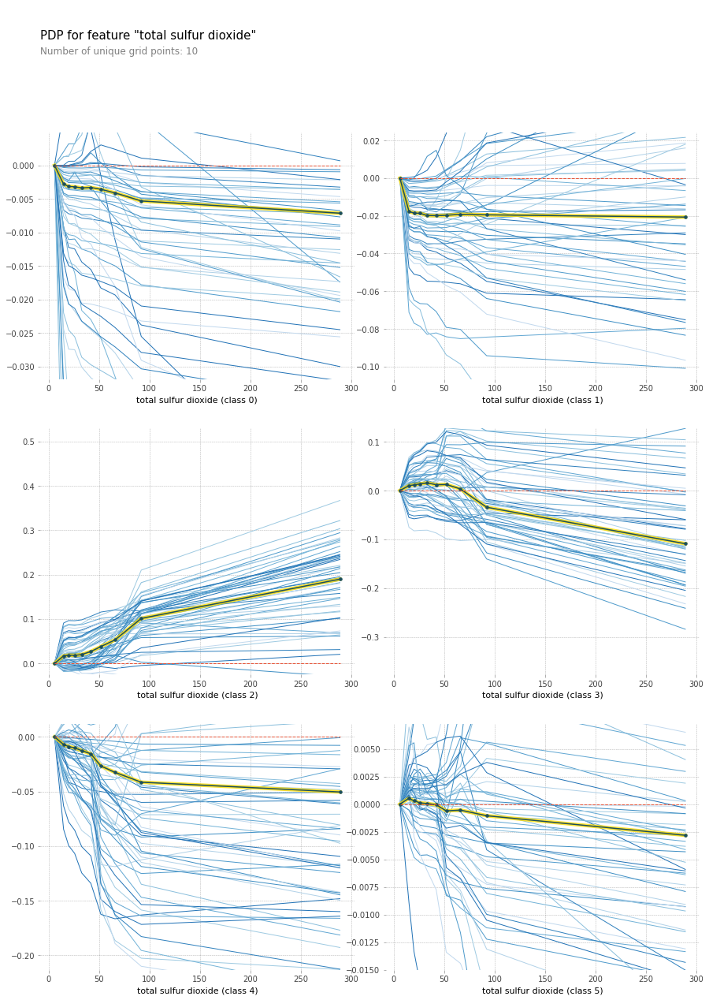

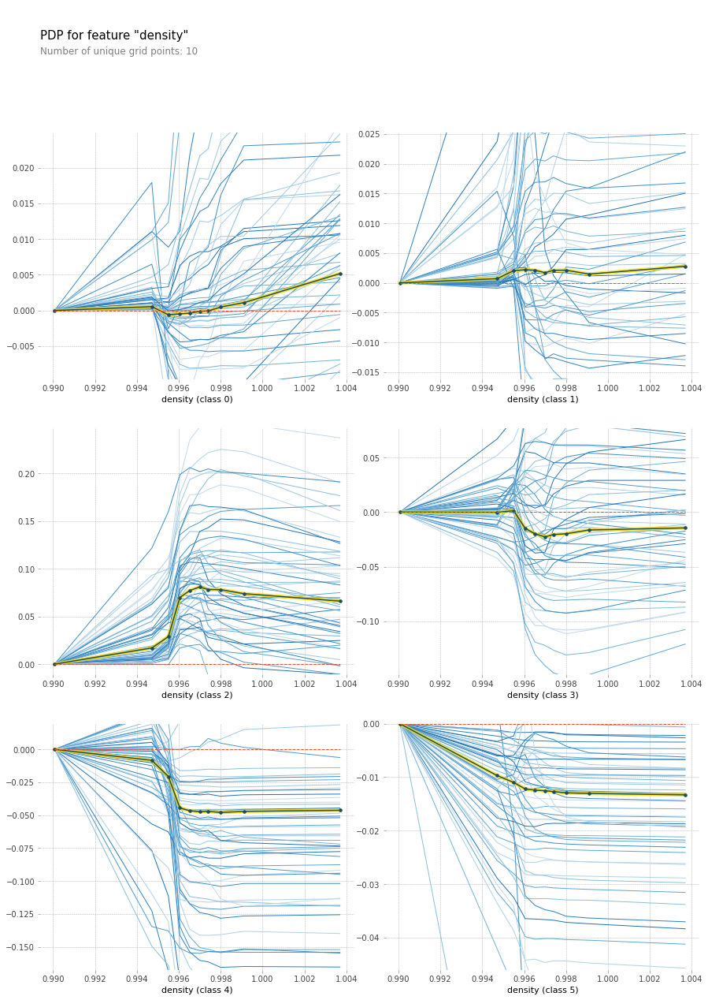

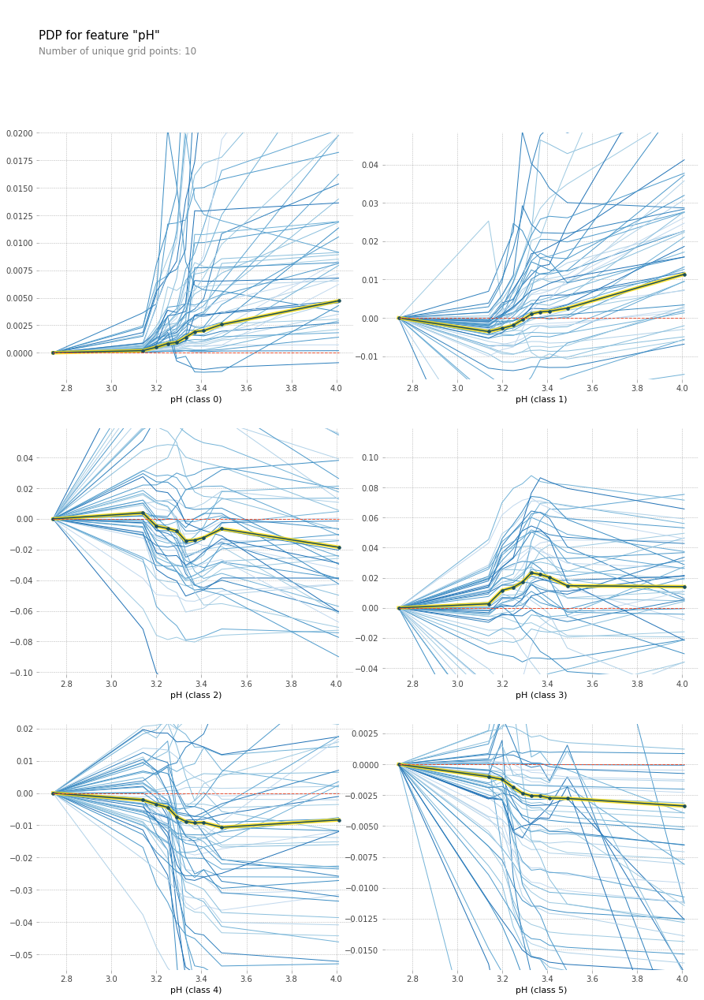

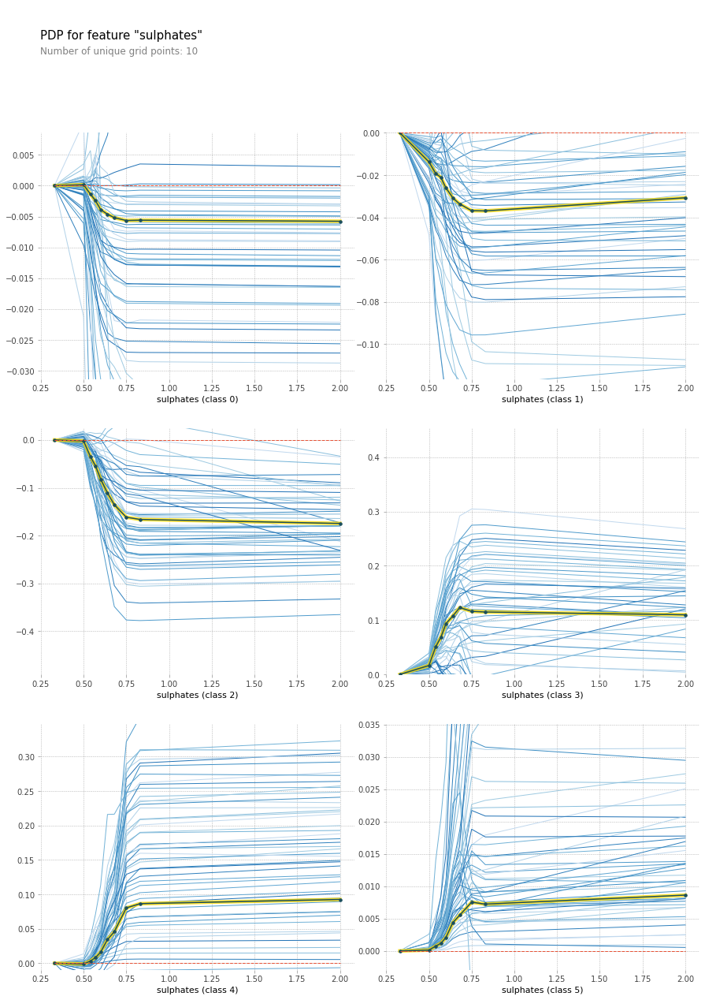

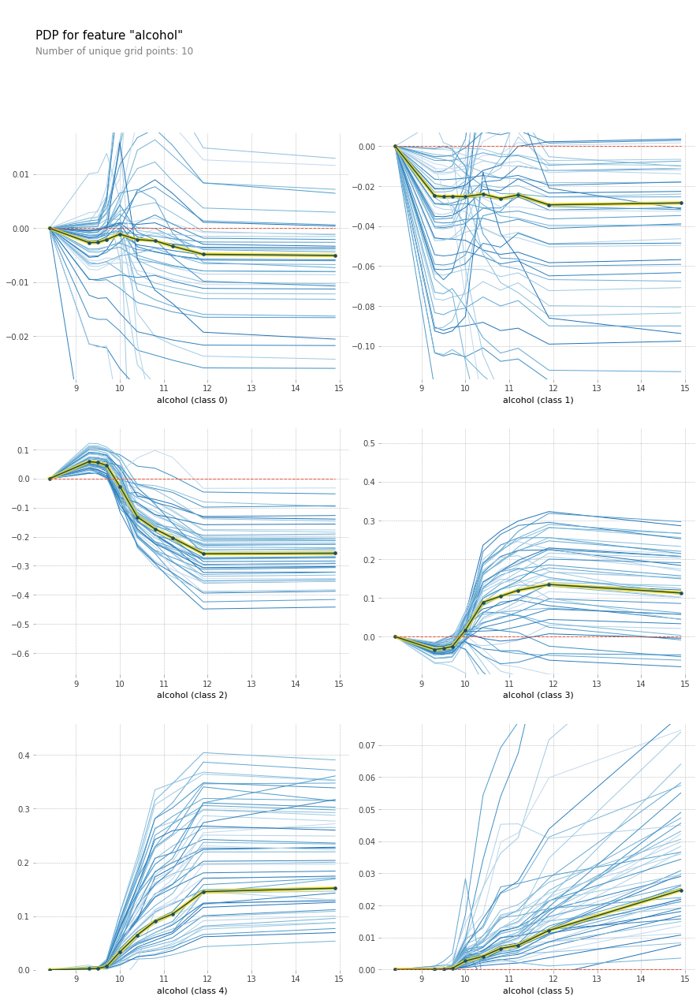

In [15]:
for column in X_train.columns :
  plot_pdp(model, X_train, column, cluster_flag=True, nb_clusters=50, lines_flag=True)

# Permutation importance

https://www.kaggle.com/dansbecker/permutation-importance

In [25]:
!pip install eli5

In [26]:
import eli5
from eli5.sklearn import PermutationImportance

Using TensorFlow backend.


In [27]:
perm = PermutationImportance(model, random_state=1).fit(X_test, Y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1194 ± 0.0286,alcohol
0.0506 ± 0.0245,sulphates
0.0500 ± 0.0296,total sulfur dioxide
0.0350 ± 0.0183,volatile acidity
0.0238 ± 0.0215,fixed acidity
0.0181 ± 0.0257,citric acid
0.0175 ± 0.0179,density
0.0150 ± 0.0145,chlorides
0.0131 ± 0.0100,residual sugar
0.0119 ± 0.0108,free sulfur dioxide


# SHAP

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

In [28]:
!pip install shap

     |████████████████████████████████| 276kB 7.8MB/s 
  Created wheel for shap: filename=shap-0.35.0-cp36-cp36m-linux_x86_64.whl size=394113 sha256=8b7c726c2e03e762c41c4f5d28e0660f3c9c3177649d99c991a585041015cab7
  Stored in directory: /root/.cache/pip/wheels/e7/f7/0f/b57055080cf8894906b3bd3616d2fc2bfd0b12d5161bcb24ac
Successfully built shap


In [29]:
import shap

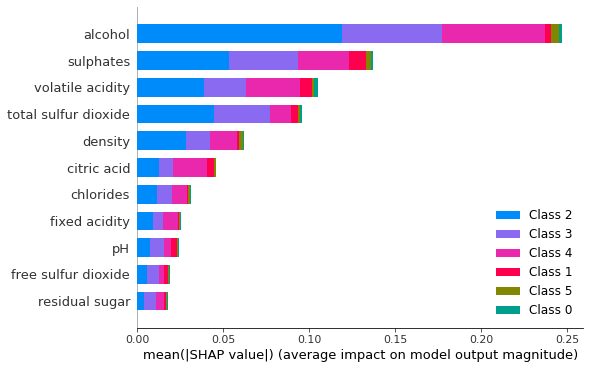

In [30]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

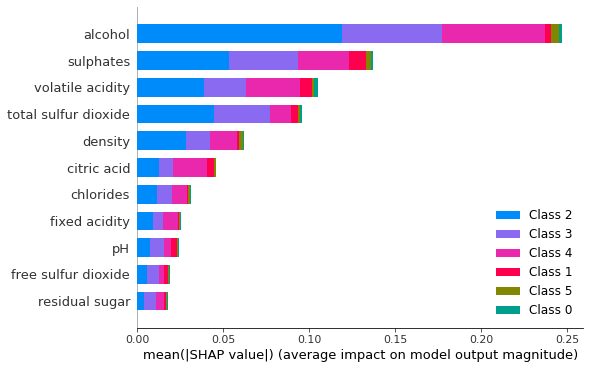

In [36]:
shap.summary_plot(shap_values, X_train)

Dependance plot on SHAP :

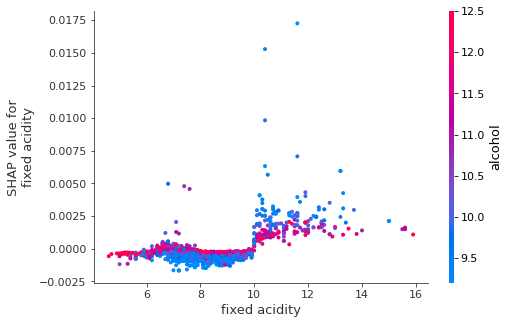

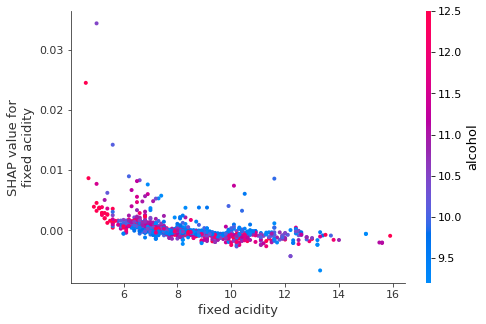

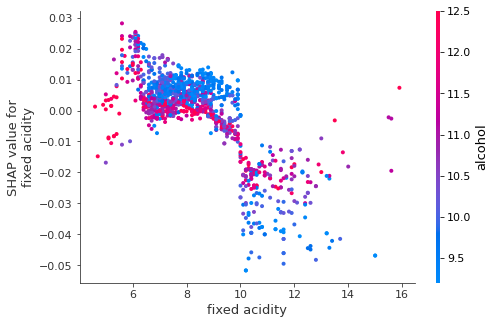

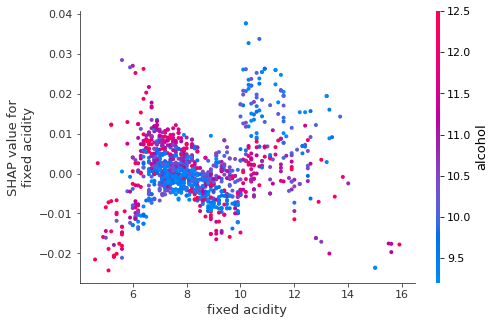

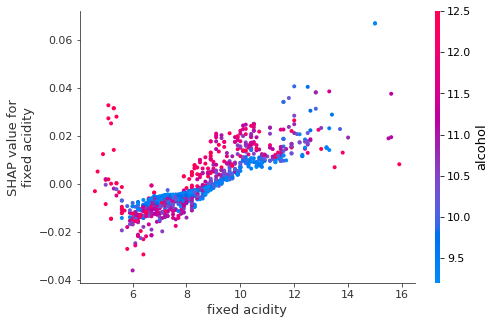

...

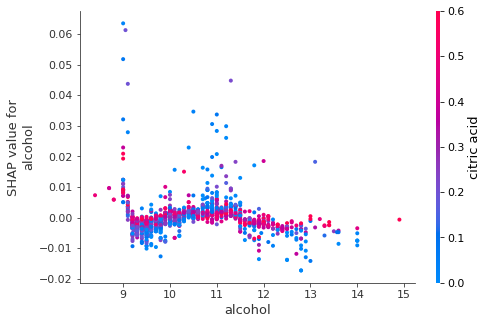

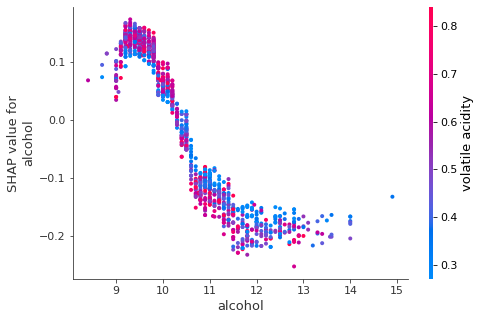

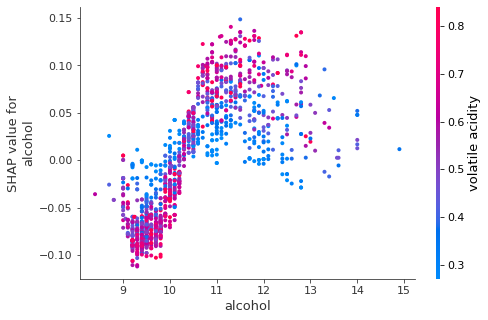

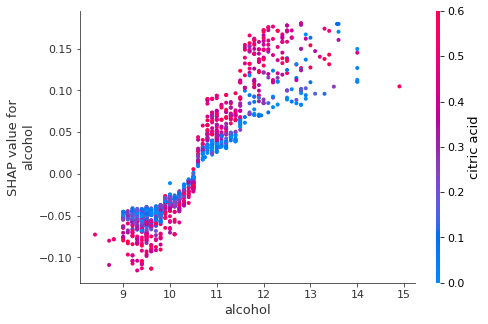

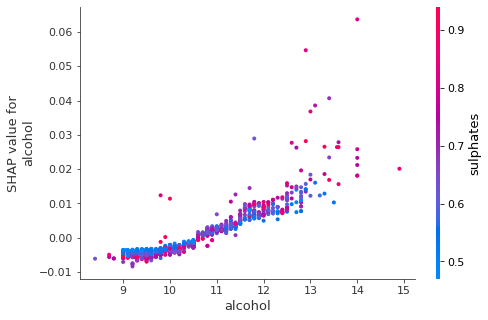

In [42]:
for column in X_train.columns :

  if isinstance(shap_values, list) :

    for classe in range(len(shap_values)) :

      shap.dependence_plot(column, shap_values[classe], X_train)

  else :
    
    shap.dependence_plot(column, shap_values, X_train)

# Feature importance

https://www.analyticsvidhya.com/blog/2019/08/decoding-black-box-step-by-step-guide-interpretable-machine-learning-models-python/


https://www.kaggle.com/bersk91/uni-analytics-datadragons/notebook

Feature: 0, Score: 0.05469
Feature: 1, Score: 0.11030
Feature: 2, Score: 0.06028
Feature: 3, Score: 0.04959
Feature: 4, Score: 0.05672
Feature: 5, Score: 0.04329
Feature: 6, Score: 0.12178
Feature: 7, Score: 0.08536
Feature: 8, Score: 0.05152
Feature: 9, Score: 0.12825
Feature: 10, Score: 0.23822


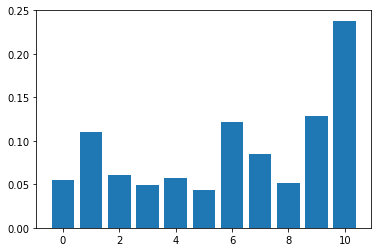

In [32]:
importance = model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

# LIME

https://blog.octo.com/introduction-a-linterpretation-de-modeles-de-machine-learning/

In [33]:
!pip install lime

     |████████████████████████████████| 276kB 8.0MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp36-none-any.whl size=283845 sha256=99e0c1fed64d5b9782130db61aaba52dc276fa7ce8ddf30dff6a257746801dd5
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [34]:
import lime
import lime.lime_tabular


In [35]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, mode='regression',training_labels=Y_train, 
                                                   feature_names=df.columns)
explanation = explainer.explain_instance(X_test.values[0], model.predict)
explanation.show_in_notebook()